In [ ]:
from keras.applications.vgg16 import VGG16
# load the model
model = VGG16()

553467096/553467096 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [ ]:
model.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 138,357,544 (527.79 MB)

 Trainable params: 138,357,544 (527.79 MB)

 Non-trainable params: 0 (0.00 B)

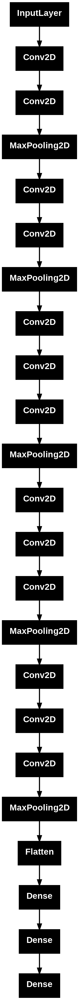

In [ ]:
from keras.utils import plot_model

plot_model(model)

In [ ]:
for i in range(len(model.layers)):
    # check for convolutional layer
    if 'conv' not in model.layers[i].name:
        continue
    # get filter weights
    filters, biases = model.layers[i].get_weights()
    print(model.layers[i].name, filters.shape)

block1_conv1 (3, 3, 3, 64)
block1_conv2 (3, 3, 64, 64)
block2_conv1 (3, 3, 64, 128)
block2_conv2 (3, 3, 128, 128)
block3_conv1 (3, 3, 128, 256)
block3_conv2 (3, 3, 256, 256)
block3_conv3 (3, 3, 256, 256)
block4_conv1 (3, 3, 256, 512)
block4_conv2 (3, 3, 512, 512)
block4_conv3 (3, 3, 512, 512)
block5_conv1 (3, 3, 512, 512)
block5_conv2 (3, 3, 512, 512)
block5_conv3 (3, 3, 512, 512)


In [ ]:
# retrieve weights from the second hidden layer
filters, biases = model.layers[1].get_weights()

In [ ]:
# normalize filter values to 0-1 so we can visualize them

f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)

In [ ]:
from matplotlib import pyplot


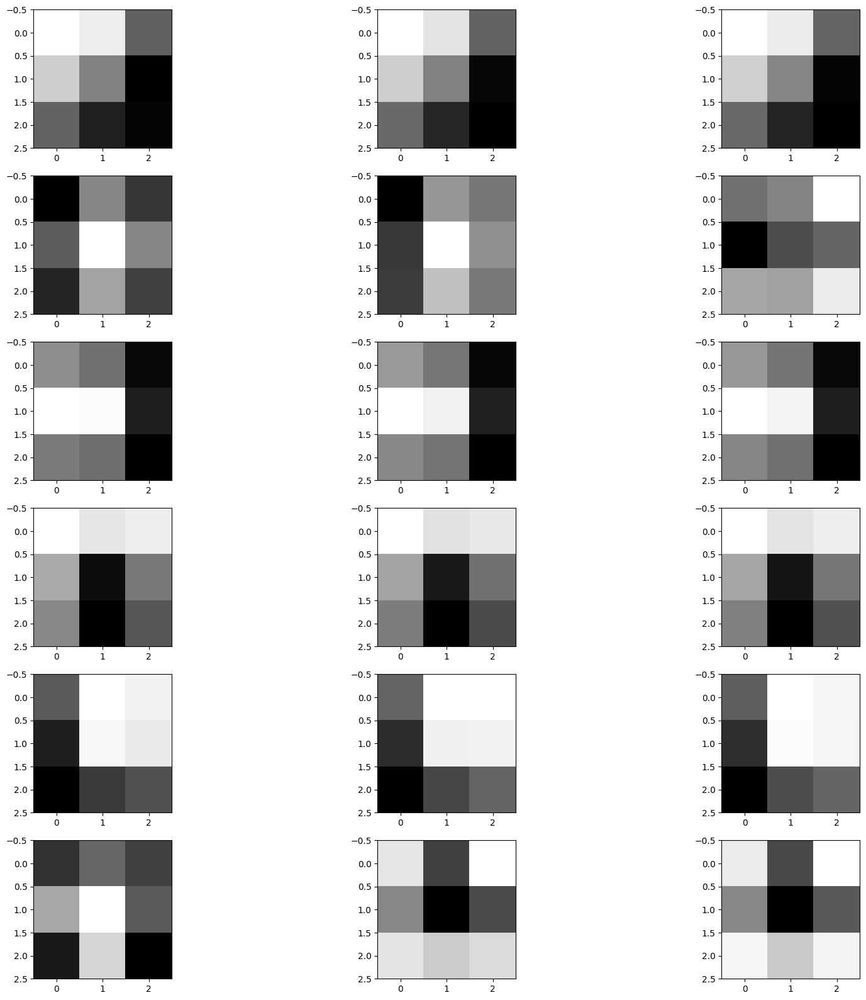

In [ ]:
n_filters=6
ix=1
fig = pyplot.figure(figsize=(20,20))
for i in range(n_filters):

    # get the filter
    f = filters[:, :, :, i]
    for j in range(3):
        # subplot for 6 filters and 3 channels
        pyplot.subplot(n_filters, 3, ix)
        pyplot.imshow(f[:, :, j], cmap='gray')
        ix += 1
# show the figure
pyplot.show()

In [ ]:
from tensorflow.keras.models import Model

model = Model(inputs=model.inputs, outputs=model.layers[1].output)

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input
from numpy import expand_dims


In [ ]:
image = load_img('/content/rahul.jpg', target_size=(224, 224))

# convert the image to an array
image = img_to_array(image)

# expand dimensions so that it represents a single 'sample'
image = expand_dims(image,axis=0)

image = preprocess_input(image)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


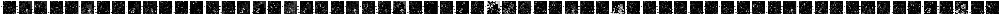

In [ ]:
# calculating feature_map
features = model.predict(image)

fig = pyplot.figure(figsize=(200,150))
for i in range(1,features.shape[3]+1):
    pyplot.subplot(1,features.shape[3],i)
    pyplot.imshow(features[0,:,:,i-1],cmap='gray')
pyplot.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


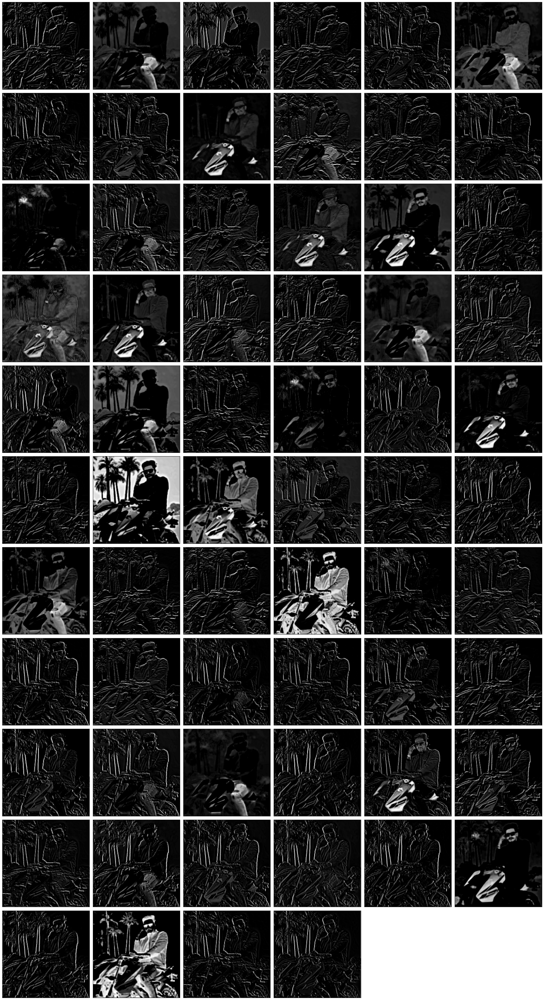

In [ ]:
import matplotlib.pyplot as plt
import math

# Predict features from intermediate model
features = model.predict(image)

# Number of feature maps
n_features = features.shape[3]

# Grid size
cols = 6  # kam columns se images badi dikhegi
rows = math.ceil(n_features / cols)

# Bigger figure size for larger images
fig = plt.figure(figsize=(cols * 4, rows * 4))

for i in range(n_features):
    ax = plt.subplot(rows, cols, i + 1)
    ax.set_xticks([])
    ax.set_yticks([])
    plt.imshow(features[0, :, :, i], cmap='gray')

plt.tight_layout()
plt.show()


In [ ]:
mode12 = VGG16()

In [ ]:
layer_index = [2,5,9,13,17]
outputs = [mode12.layers[i].output for i in layer_index]

mode13 = Model(inputs=mode12.inputs, outputs=outputs)

In [ ]:
features = mode13.predict(image)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 586ms/step


In [ ]:
features = mode13.predict(image)

for i,fmap in zip(layer_index , feature_map):
  fig = pyplot.figure(figsize=(20,15))
  fig.suptitle("Layer_{}".format(i))
  for j in range(1,fmap.shape[3]+1):
    pyplot.subplot(1,fmap.shape[3],j)
    pyplot.imshow(fmap[0,:,:,j-1],cmap='gray')

  pyplot.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


NameError: name 'feature_map' is not defined

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


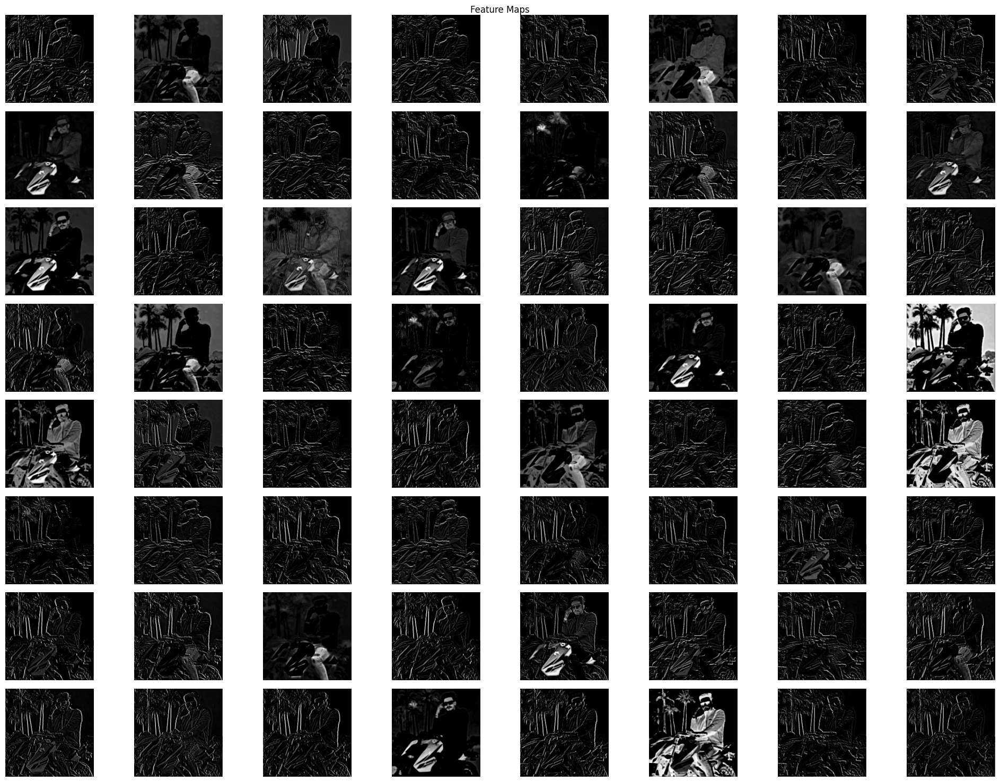

In [ ]:
from matplotlib import pyplot as plt

features = model.predict(image)

fig = plt.figure(figsize=(20, 15))
fig.suptitle("Feature Maps")

n_filters = features.shape[3]

for j in range(n_filters):
    plt.subplot(8, 8, j + 1)  # adjust layout if n_filters != 64
    plt.imshow(features[0, :, :, j], cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()
